In [1]:
import os, random, numpy as np

os.environ['OMP_NUM_THREADS'] = '1'
os.environ['OPENBLAS_NUM_THREADS'] = '1'
os.environ['MKL_NUM_THREADS'] = '1'
os.environ['VECLIB_MAXIMUM_THREADS'] = '1'
os.environ['NUMEXPR_NUM_THREADS'] = '1'

os.environ['PYTHONHASHSEED'] = '99'

random.seed(99)
np.random.seed(99)

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import colormaps as cm
from matplotlib import rcParams
rcParams['font.family'] = 'Times New Roman'
import seaborn as sns


import sys
sys.path.append('../src')
from pca.PCARiskAllocator import PCARiskAllocator

# 1. Generate Data

### Function: `generate_correlation`

This function generates a synthetic **correlation matrix** for $n_{assets}$, divided into $n_{groups}$ groups.

- **Within-group correlations** are set to a constant value $corr_{within}$.
- **Between-group correlations** are set to a constant value $corr_{between}$.
- The diagonal elements are filled with $1$, since the correlation of an asset with itself is always $1$.

---

#### Mathematical Structure

The correlation matrix $C \in \mathbb{R}^{n_{assets} \times n_{assets}}$ is constructed as:

\$
C_{ij} =
\begin{cases}
1 & \text{if } i = j \\
corr_{within} & \text{if assets $i$ and $j$ are in the same group} \\
corr_{between} & \text{otherwise}
\end{cases}
\$

This structure allows us to simulate a block-wise correlation pattern.
 >⚠️ **Note**: for convenience, the function assumes that the number of assets is divided into groups without a remainder.

In [3]:
def generate_correlation(n_assets, n_groups, corr_within, corr_between):
    corr = np.full((n_assets, n_assets), corr_between, dtype=float)
    np.fill_diagonal(corr, 1.0)

    group_size = n_assets // n_groups
    for g in range(n_groups):
        start = g * group_size
        end = (g + 1) * group_size
        corr[start:end, start:end] = corr_within
        np.fill_diagonal(corr[start:end, start:end], 1.0)

    return corr

### Function: `simulate_gbm`

This function simulates asset prices using a **Geometric Brownian Motion (GBM)** with correlation across assets, based on a Monte Carlo approach.

Inputs:
- $z$: Random shocks with shape $(n_{steps}, n_{assets})$
- $mean\_vector$: Vector of expected returns $\mu$
- $std\_vector$: Vector of volatilities $\sigma$
- $corr\_matrix$: Asset correlation matrix
- $dt$: Time increment (default $1/252$ for daily steps in a trading year)

---

#### Mathematical Formulation

The covariance matrix is:

\$
\Sigma = \sigma \sigma^T \odot C
\$

where $\sigma$ is the volatility vector and $C$ is the correlation matrix.  
A ***Cholesky decomposition*** is applied:

\$
\Sigma = L L^T
\$

The simulated log-returns are given by:

\$
\Delta \ln S_t = \mu \, dt - \tfrac{1}{2}\sigma^2 dt + L \cdot z_t \sqrt{dt}
\$

The price process is recovered as:

\$
S_t = S_0 \cdot \exp\left( \sum_{k=1}^{t} \Delta \ln S_k \right)
\$

---

#### Output
- `logs`: Matrix of simulated log-returns
- `prices`: Simulated price paths

In [4]:
def simulate_gbm(z, mean_vector, std_vector, corr_matrix, dt=1/252):
    n_assets = len(mean_vector)
    assert z.shape[1] == n_assets, "Shape mismatch: z must have shape (n_steps, n_assets)"
    
    cov = np.outer(std_vector, std_vector) * corr_matrix
    cov += 1e-10 * np.eye(n_assets)  # jitter
    ch = np.linalg.cholesky(cov)
    
    shocks = z @ ch.T * np.sqrt(dt)
    drift = (mean_vector - 0.5 * std_vector**2) * dt
    logs = shocks + drift 
    prices = np.exp(np.cumsum(logs, axis=0))
    
    return logs, prices

### Baseline Data

We define the baseline characteristics of the synthetic assets:

- Number of assets: $N\_ASSETS = 300$
- Mean vector sampled from a normal distribution:  
  \$
  \mu \sim \mathcal{N}(0.1, \, 0.07^2)
  \$
- Standard deviation vector (absolute values to ensure positivity):  
  \$
  \sigma \sim \left| \mathcal{N}(0.15, \, 0.1^2) \right|
  \$
- Correlation matrix generated with three groups of assets:  
  - Within-group correlation: $0.75$
  - Between-group correlation: $0.3$

Thus, each synthetic asset is characterized by:  
\$
X_i \sim GBM(\mu_i, \sigma_i, C)
\$

where $C$ is the block correlation structure defined by `generate_correlation`.

In [5]:
N_ASSETS = 300

In [6]:
baseline_mean_vector = np.random.normal(0.1, 0.07, size=N_ASSETS)
baseline_std_vector = abs(np.random.normal(0.15, 0.1, size=N_ASSETS))
baseline_corr_matrix = generate_correlation(N_ASSETS, n_groups=3, corr_within=0.75, corr_between=0.3)

C:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
C:\Users\USER\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


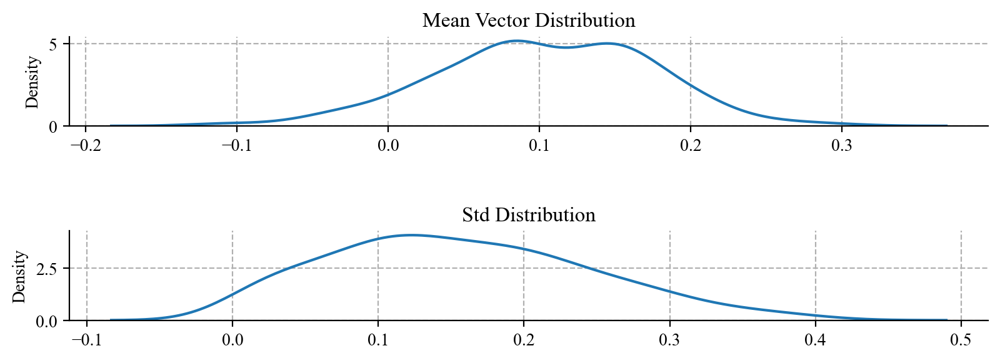

In [7]:
fig, ax = plt.subplots(2,1, figsize=(8, 3), dpi=200)

sns.kdeplot(baseline_mean_vector, ax=ax[0])
ax[0].set_title('Mean Vector Distribution')
ax[0].grid(ls='--')

sns.kdeplot(baseline_std_vector, ax=ax[1])
ax[1].set_title('Std Distribution')
ax[1].grid(ls='--')

sns.despine()
plt.tight_layout(h_pad=3)
plt.show()

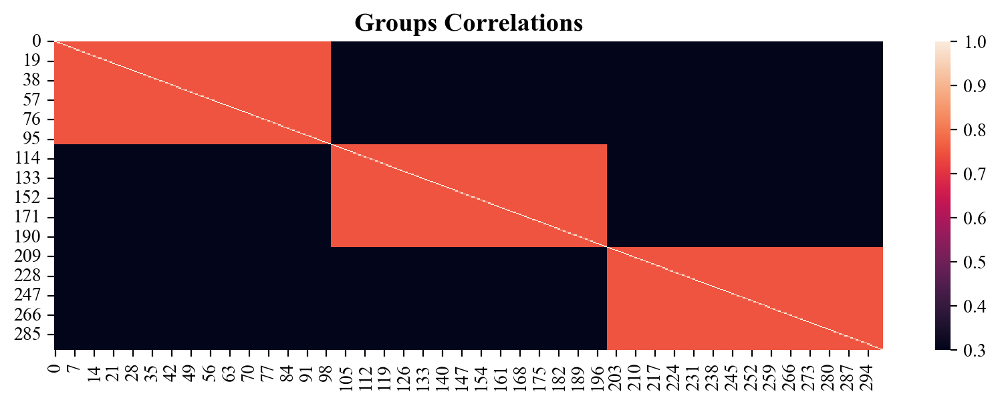

In [8]:
plt.figure(figsize=(10,3), dpi=200)
sns.heatmap(baseline_corr_matrix)
plt.title('Groups Correlations', size=14, weight='bold')
plt.show()

### Simulation Setup

We define the parameters of the Monte Carlo experiment:

- Number of steps: 
  \$
  N\_{STEPS} = 252 \times 2 = 504
  \$
  (representing two trading years with 252 days each)

- Number of simulations: 
  \$
  N\_{SIM} = 100
  \$

- Random shocks are generated from a standard normal distribution:
  \$
  Z \sim \mathcal{N}(0,1)^{N\_{SIM} \times N\_{STEPS} \times N\_{ASSETS}}
  \$

---

### Function: `run_scenarios`

This function runs multiple Geometric Brownian Motion (GBM) scenarios using the predefined parameters.

- **Inputs**:
  - $Z$: random shocks
  - $\mu$: mean vector
  - $\sigma$: standard deviation vector
  - $C$: correlation matrix

- **Process**:
  For each simulation $s = 1, \dots, N\_{SIM}$:
  \[
  ( \text{logs}, \, \text{prices} ) = \text{simulate\_gbm}(Z_s, \mu, \sigma, C)
  \]

- **Outputs**:
  - `logs`: matrix of log returns
  - `prices`: matrix of simulated prices

Both outputs have shape:
\$
(N\_{SIM} \, N\_{STEPS}, \ N\_{ASSETS})
\$

In [9]:
N_STEPS = 252 * 2
N_SIM = 100
Z = np.random.normal(size=(N_SIM, N_STEPS, N_ASSETS))

In [10]:
def run_scenarios(Z, mean_vector, std_vector, corr_matrix):
    logs_list = []
    prices_list = []

    for s in range(Z.shape[0]):       # N_SIM
        logs, prices = simulate_gbm(
            Z[s],
            mean_vector,
            std_vector,
            corr_matrix
        )
        logs_list.append(logs)
        prices_list.append(prices)

    return np.array(logs_list), np.array(prices_list)

In [11]:
baseline_logs, baseline_prices = run_scenarios(Z, 
                                              baseline_mean_vector, 
                                              baseline_std_vector,
                                              baseline_corr_matrix)

In [12]:
baseline_prices.shape, baseline_logs.shape

((100, 504, 300), (100, 504, 300))

In [13]:
baseline_prices[1].shape, baseline_prices.T.shape

((504, 300), (300, 504, 100))

### Visualization: Random Paths

The function `plot_random_paths` is used to visualize a subset of simulated asset paths from a given simulation.  

- **Inputs**:
  - `data`: 3D array with shape $(N\_{SIM}, N\_{STEPS}, N\_{ASSETS})$
  - `n_assets`: total number of assets
  - `n_random`: number of assets to randomly sample for plotting
  - `title`: optional plot title    



- **Output**:
  - A line plot showing $n\_{random}$ asset return trajectories over time for the selected simulation.

This visualization helps illustrate the diversity of asset dynamics within one Monte Carlo scenario.


In [14]:
def plot_random_paths(data, n_assets, n_random, title=None):
    random_sim = np.random.randint(0, data.shape[0])
    random_index = np.random.randint(0, n_assets, n_random)
    
    plt.figure(figsize=(18,6), dpi=200)
    for i in random_index:
        plt.plot(data.T[i, :, random_sim],
                 alpha=.7)
    
    plt.axhline(1, lw=2, color='k')

    if title:
        plt.title(f'{title}\nSimulation number {random_sim}', size=18, weight='bold')
    plt.xlabel('Time', size=14, weight='bold')
    plt.ylabel('Cumulative Return', size=14, weight='bold')
    
    plt.grid(ls='--')
    sns.despine()
    plt.show()

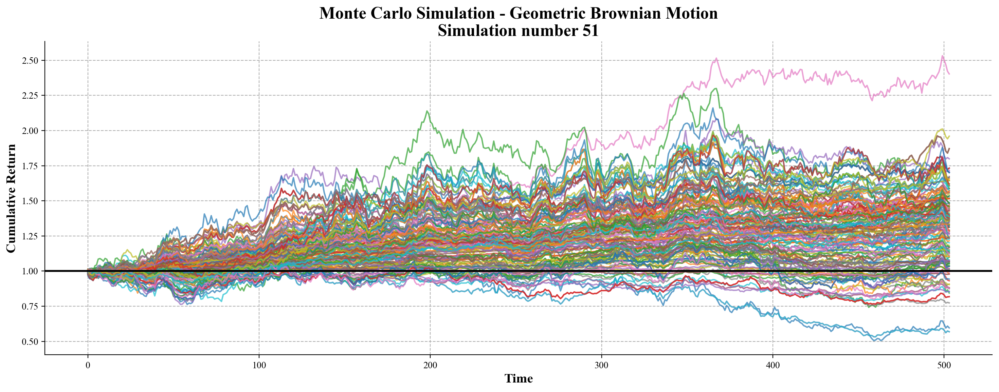

In [15]:
plot_random_paths(baseline_prices, N_ASSETS, 200, 'Monte Carlo Simulation - Geometric Brownian Motion')

# 2. Calculate Weights Based on Synthetic Historical Data

We estimate portfolio weights using PCA-based allocation methods across multiple Monte Carlo simulations.

---

### Function: `train_pca_loop`

- **Inputs**:
  - `data`: log-return simulations, shape 
    \$
    (N\_{SIM}, N\_{STEPS}, N\_{ASSETS})
    \$
  - `methods`: list of allocation methods (e.g., `minvar`, `equal`, `proportional`, `inverse`)

- **Process**:
  For each allocation method $m \in \text{methods}$ and each simulation $s = 1, \dots, N\_{SIM}$:
  1. Fit a PCA-based risk allocator:
     \$
     w\_{m,s} = \text{PCARiskAllocator}(\text{data}[s]) 
     \$
  2. Extract weights $w\_{m,s}$ and store them in a DataFrame.
  3. Assign a **MultiIndex** for columns:
     - Level 1: method name
     - Level 2: simulation number

- **Output**:  
  Concatenated DataFrame of weights:
  $
  \text{methods\_weights} \in \mathbb{R}^{N\_{ASSETS} \times (|\text{methods}| \cdot N\_{SIM})}
  $

In [16]:
baseline_prices.shape, baseline_logs.shape

((100, 504, 300), (100, 504, 300))

In [17]:
def train_pca_loop(data, methods):
    n_sims = data.shape[0]
    all_blocks = []

    for m in methods:
        weights_list = []
        for s in range(n_sims):
            pca = PCARiskAllocator(data[s])
            pca.fit(allocation=m)
            weights_list.append(pca.weights)
        block = pd.DataFrame(weights_list).T
        block.columns = pd.MultiIndex.from_product([[m], [f"sim_{s}" for s in range(n_sims)]])
        all_blocks.append(block)

    return pd.concat(all_blocks, axis=1)

In [18]:
%%time
METHODS = ['minvar', 'equal', 'proportional', 'inverse']
methods_weights = train_pca_loop(baseline_logs, METHODS)

CPU times: total: 2min 49s
Wall time: 2min 21s


In [19]:
methods_weights.head()

minvar                                                              \
      sim_0     sim_1     sim_2     sim_3     sim_4     sim_5     sim_6   
0 -0.000112 -0.002519 -0.000392 -0.000744 -0.000449  0.001004 -0.000438   
1 -0.001255  0.123682 -0.021858  0.012491  0.053484 -0.012028 -0.013827   
2 -0.011462  0.129384 -0.023194 -0.000825 -0.007428  0.006533 -0.010777   
3 -0.000359 -0.006740  0.000353 -0.000150 -0.000091 -0.000374 -0.000998   
4 -0.000619 -0.005368  0.000860 -0.000638 -0.000536  0.000009  0.000838   

                                 ...   inverse                                \
      sim_7     sim_8     sim_9  ...    sim_90    sim_91    sim_92    sim_93   
0  0.000726  0.000292 -0.000200  ...  0.001266 -0.096446 -0.014714 -0.156261   
1 -0.010975 -0.007070 -0.002587  ...  0.163626  1.162980  0.187794 -0.131079   
2  0.008459 -0.004250  0.006276  ...  0.187941 -0.295109  0.459352 -4.751691   
3 -0.000136 -0.000084  0.000088  ...  0.024401  0.137361 -0.013570 -0.435217   
4  0.000273 -0.000046 -0.000553  ... -0.038672  0.068737  0.013992 -0.266143   

                                                                
      sim_94    sim_95    sim_96    sim_97    sim_98    sim_99  
0  -0.105606  0.002096  0.033609  0.023166  0.000393 -0.026388  
1   0.492224  0.576676 -0.059321 -0.992393  0.232232  0.157543  
2  10.928560 -0.145205 -0.247004  0.417440  0.010843  0.157025  
3   0.636902 -0.055878 -0.007135  0.124586  0.035923 -0.023695  
4   1.256436 -0.053957  0.068844  0.039414  0.012611 -0.010818  

[5 rows x 400 columns]

# 3. Construct Portfolios

We construct portfolios by multiplying simulated log-returns with the corresponding weights of each allocation method.

---

### Function: `compute_portfolio`

- **Inputs**:
  - `baseline_logs`: simulated log-returns, shape
    $$
    (N\_{SIM}, N\_{STEPS}, N\_{ASSETS})
    $$
  - `methods_weights`: DataFrame of weights with MultiIndex (method, simulation).
  - `method_name`: one of the allocation methods (`minvar`, `equal`, `proportional`, `inverse`).

- **Process**:
  For each simulation $s = 1, \dots, N\_{SIM}$:
  1. Extract the corresponding weight vector $w\_{m,s}$ for method $m$ and simulation $s$.
  2. Compute portfolio log-returns:
     $$
     r\_{m,s}(t) = \sum\_{i=1}^{N\_{ASSETS}} w\_{m,s}^{(i)} \cdot \ell\_{s,t}^{(i)}
     $$
     where $\ell\_{s,t}^{(i)}$ is the log-return of asset $i$ at time $t$ in simulation $s$.
  3. Store results for averaging.

- **Output**:
  Mean log-return path across all simulations:
  $$
  \bar{r}\_{m}(t) = \frac{1}{N\_{SIM}} \sum\_{s=1}^{N\_{SIM}} r\_{m,s}(t)
  $$

In [20]:
minvar_weights = methods_weights.xs('minvar', axis=1).values
equal_weights = methods_weights.xs('equal', axis=1).values
proportional_weights = methods_weights.xs('proportional', axis=1).values
inverse_weights = methods_weights.xs('inverse', axis=1).values

In [21]:
def compute_portfolio(baseline_logs, methods_weights, method_name):
    n_sim, n_steps, n_assets = baseline_logs.shape
    logs = []

    for s in range(n_sim):
        w = methods_weights.loc[:, (method_name, f"sim_{s}")].to_numpy().ravel()
        portfolio_logreturns = baseline_logs[s] @ w
        logs.append(portfolio_logreturns)

    return np.mean(logs, axis=0)

In [22]:
avg_logs_minvar = compute_portfolio(baseline_logs, methods_weights, "minvar")
avg_logs_equal = compute_portfolio(baseline_logs, methods_weights, "equal")
avg_logs_proportional = compute_portfolio(baseline_logs, methods_weights, "proportional")
avg_logs_inverse = compute_portfolio(baseline_logs, methods_weights, "inverse")

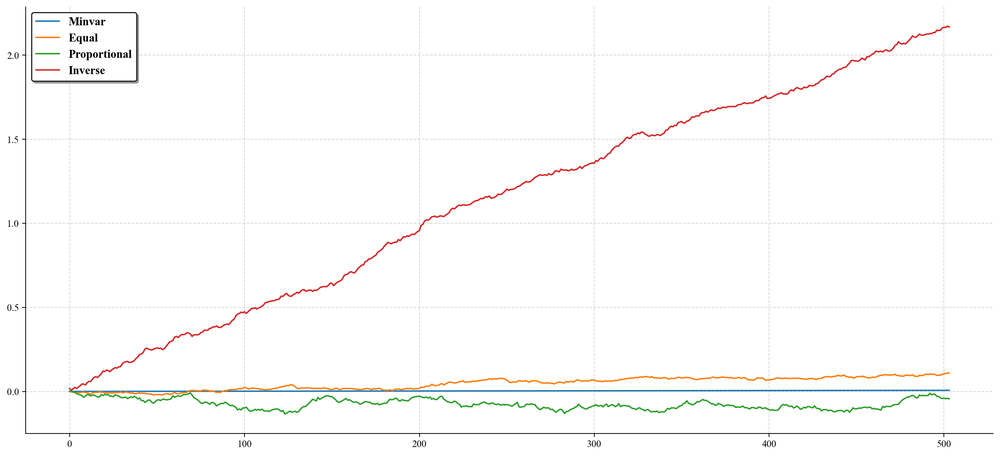

In [23]:
plt.figure(figsize=(18,8), dpi=200)
plt.plot(avg_logs_minvar.cumsum())
plt.plot(avg_logs_equal.cumsum())
plt.plot(avg_logs_proportional.cumsum())
plt.plot(avg_logs_inverse.cumsum())


plt.grid(ls='--', alpha=.5)
plt.legend(['Minvar', 'Equal', 'Proportional', 'Inverse'],
          edgecolor='k', shadow=True,
          prop={'size': 12, 'weight':'bold'})
sns.despine()
plt.show()

# 4. Experiments: Portfolio Performance Metrics

We evaluate each portfolio strategy across multiple Monte Carlo simulations by computing standard performance and risk metrics.

---

### Function: `calc_metrics_multi`

- **Inputs**:
  - `portfolios`: list of NumPy arrays, each with shape
    $$
    (N_{\text{SIM}}, N_{\text{STEPS}}, 1)
    $$
    representing simulated portfolio log-returns.
  - `names`: list of method names (e.g., `minvar`, `equal`, etc.).
  - `rf`: risk-free rate (default $4.5\%$).
  - `alpha`: significance level for Value-at-Risk and Expected Shortfall (default $5\%$).

---

### Metrics Computed

For each simulation $s = 1, \dots, N_{\text{SIM}}$:

1. **Annualized Return**:
   $$
   \mu_{\text{annual}} = \bar{r}_{\text{daily}} \cdot 252
   $$

2. **Annualized Volatility**:
   $$
   \sigma_{\text{annual}} = \sigma_{\text{daily}} \cdot \sqrt{252}
   $$

3. **Sharpe Ratio**:
   $$
   \text{Sharpe} = \frac{\mu_{\text{annual}} - r_f}{\sigma_{\text{annual}}}
   $$

4. **Sortino Ratio** (downside deviation $\sigma_d$):
   $$
   \text{Sortino} = \frac{\mu_{\text{annual}} - r_f}{\sigma_d \cdot \sqrt{252}}
   $$

5. **Calmar Ratio**:
   $$
   \text{Calmar} = \frac{\mu_{\text{annual}} - r_f}{\max(\text{Drawdown})}
   $$

6. **Maximum Drawdown**:
   $$
   \text{MaxDD} = \max_t \frac{\max_{u \leq t} P_u - P_t}{\max_{u \leq t} P_u}
   $$

7. **Value-at-Risk (VaR)** at level $\alpha$:
   $$
   \text{VaR}_{\alpha} = \text{Percentile}_{\alpha}(r_t)
   $$

8. **Expected Shortfall (ES)** at level $\alpha$:
   $$
   \text{ES}_{\alpha} = \mathbb{E}[r_t \mid r_t \leq \text{VaR}_{\alpha}]
   $$

---

### Output

- A DataFrame summarizing **mean metrics across all simulations**:
  $$
  \text{Results} \in \mathbb{R}^{|\text{metrics}| \times |\text{methods}|}
  $$

where rows are performance metrics and columns are allocation methods.


In [24]:
def calc_metrics_multi(portfolios, names, rf=0.045, alpha=5):
    """
    portfolios: list of np.ndarray, כל אחד בצורה (n_sim, n_steps, 1)
    names: list of str, שמות השיטות לעמודות
    """
    results = {}

    for portfolio, name in zip(portfolios, names):
        all_metrics = []

        for i in range(portfolio.shape[0]):
            df = pd.DataFrame(portfolio[i], columns=["returns"])
            
            mean_daily = df["returns"].mean()
            std_daily = df["returns"].std()
            mean_annual = mean_daily * 252
            std_annual = std_daily * (252**0.5)

            last_peak = df["returns"].cummax()
            dd = (last_peak - df["returns"]) / last_peak
            maxdd = dd.max()

            var = np.percentile(df["returns"], alpha)
            es = df["returns"][df["returns"] <= var].mean()

            downside = df["returns"][df["returns"] < 0].std()
            downside_annual = downside * (252**0.5)

            metrics = pd.Series({
                "Return": mean_annual,
                "Volatility": std_annual,
                "Sharpe": (mean_annual - rf) / std_annual if std_annual > 0 else np.nan,
                "Sortino": (mean_annual - rf) / downside_annual if downside_annual > 0 else np.nan,
                "Calmar": (mean_annual - rf) / maxdd if maxdd > 0 else np.nan,
                "MaxDD": maxdd,
                f"VaR_{alpha}%": var,
                f"ES_{alpha}%": es
            })

            all_metrics.append(metrics)

        results[name] = pd.DataFrame(all_metrics).mean()

    return pd.DataFrame(results)

### Function: `compare_results`

This function visualizes the portfolio performance metrics calculated in `calc_metrics_multi`.

---

- **Input**:
  - `results`: DataFrame with shape
    $$
    (|\text{metrics}|, |\text{methods}|)
    $$
    where rows correspond to performance metrics and columns correspond to allocation methods.
  - `title`: optional string for figure title.

---

- **Output**:
  - Comparative visualization of metrics:
    - Each subplot corresponds to a single metric (e.g., Return, Volatility, Sharpe).
    - Bars represent different allocation methods (`minvar`, `equal`, `proportional`, `inverse`).
  - Example figure layout:

  $$
  \begin{bmatrix}
  \text{Return} & \text{Volatility} & \text{Sharpe} & \text{Sortino} \\
  \text{Calmar} & \text{MaxDD} & \text{VaR}_{\alpha} & \text{ES}_{\alpha}
  \end{bmatrix}
  $$

---

This allows direct comparison of strategies across multiple performance criteria.

In [25]:
def compare_results(results, title=None):
    results_t = results.T.copy()
    
    fig, ax = plt.subplots(2, 4, figsize=(22, 10), dpi=200)
    cmap = cm.get_cmap('tab20c')

    for i, col in enumerate(results_t):
        row = i // 4
        col_i = i % 4

        colors = [cmap(j / len(results_t.index)) for j in range(len(results_t.index))]

        ax[row, col_i].bar(
            x = results_t.index,
            height = results_t[col],
            color = colors,
            edgecolor = 'k',
            zorder = 2
        )

        ax[row, col_i].set_title(col, size=14, weight='bold')

        for label in ax[row, col_i].get_xticklabels() + ax[row, col_i].get_yticklabels():
            label.set_fontweight('bold')
            label.set_fontsize(12)

        ax[row, col_i].grid(ls='--', axis='y', alpha=.5, zorder=0)

    if title:
        fig.suptitle(title, size=22, weight='bold')

    plt.tight_layout(pad=4, h_pad=4, w_pad=4)
    sns.despine()
    plt.show()

In [26]:
# --- correlation unity matrix ---
corr_unity_matrix = generate_correlation(N_ASSETS, 3, 
                                        corr_within = 0.9,
                                        corr_between = 0.9)

# --- correlation fragmention matrix ---
corr_fragmented_matrix = generate_correlation(N_ASSETS, 3,
                                             corr_within = 0.2,
                                             corr_between = 0.2)

## Experiment 1: Corr-Only Break

In this experiment, we investigate the effect of **correlation structure alone**, while keeping mean and volatility vectors constant.

---

### Setup

- **Mean vector**: fixed at $\mu = \text{baseline\_mean\_vector}$
- **Standard deviation vector**: fixed at $\sigma = \text{baseline\_std\_vector}$
- **Correlation matrices**:
  1. **Unity correlation matrix**:
     $$
     C_{\text{unity}}: \quad \rho_{\text{within}} = 0.9, \quad \rho_{\text{between}} = 0.9
     $$
     Almost perfect correlation across all groups.
  2. **Fragmented correlation matrix**:
     $$
     C_{\text{fragmented}}: \quad \rho_{\text{within}} = 0.2, \quad \rho_{\text{between}} = 0.2
     $$
     Weak correlations both within and across groups.

---

### Simulation

For each correlation structure $C \in \{C_{\text{unity}}, C_{\text{fragmented}}\}$ we run Monte Carlo scenarios:

$$
\{ \text{logs}, \text{prices} \} = \text{run\_scenarios}\big( Z, \mu, \sigma, C \big)
$$

- $Z$: common random shocks
- $\mu$: baseline mean vector
- $\sigma$: baseline standard deviation vector
- $C$: chosen correlation matrix

---

### Output

- **Logs and prices** generated under:
  - $C_{\text{unity}} \;\;\to\; (\text{corr\_unity\_logs}, \text{corr\_unity\_prices})$
  - $C_{\text{fragmented}} \;\;\to\; (\text{corr\_fragmented\_logs}, \text{corr\_fragmented\_prices})$

---

**Goal**: Isolate the impact of correlation breakdown on portfolio behavior while holding first and second moments constant.


In [27]:
# --- correlation unity prices and log returns (using corr_unity_matrix) ---
corr_unity_logs, corr_unity_prices = run_scenarios(
    Z, baseline_mean_vector, baseline_std_vector, corr_unity_matrix
)

# --- correlation cragmention prices and log returns (using corr_fragmented_matrix)---
corr_fragmented_logs, corr_fragmented_prices = run_scenarios(
    Z, baseline_mean_vector, baseline_std_vector, corr_fragmented_matrix
)

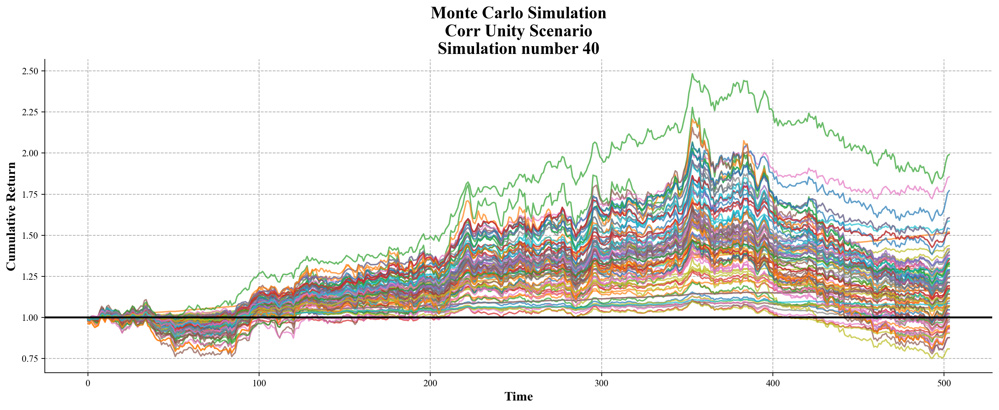

In [28]:
plot_random_paths(corr_unity_prices, N_ASSETS, 100, 'Monte Carlo Simulation\nCorr Unity Scenario')

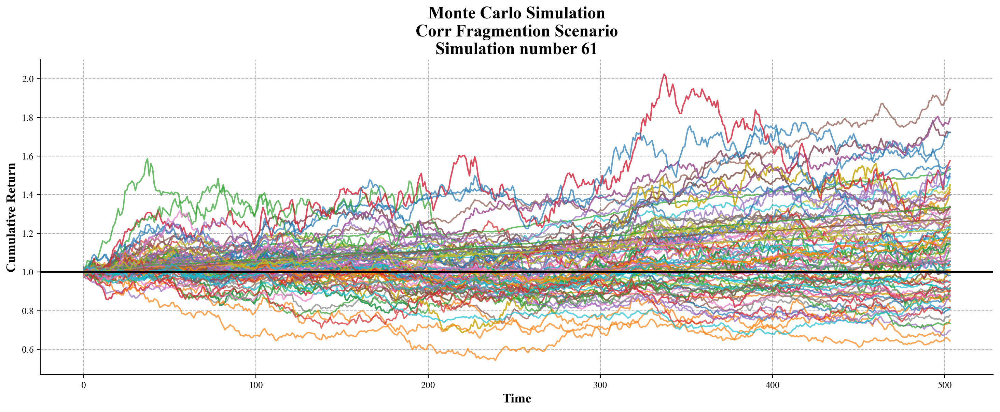

In [29]:
plot_random_paths(corr_fragmented_prices, N_ASSETS, 100, 'Monte Carlo Simulation\nCorr Fragmention Scenario')

## Portfolio Construction under Correlation Scenarios

After generating simulated log-returns and PCA-based weights, we compute portfolio log-returns for each **allocation method** under both correlation structures.

---

### Weight Preparation

- Extract weights from `methods_weights` for each method:
  $$
  W^{m} \in \mathbb{R}^{N_{\text{SIM}} \times N_{\text{ASSETS}}}
  $$
- Reshape weights to align with log-returns:
  $$
  W^{m} \;\;\to\;\; (N_{\text{SIM}}, 1, N_{\text{ASSETS}})
  $$

---

### Portfolio Log-Returns

For each method $m \in \{\text{minvar, equal, proportional, inverse}\}$ and correlation structure $C \in \{\text{unity, fragmented}\}$:

$$
P^{m,C}_{s,t} \;=\; \sum_{i=1}^{N_{\text{ASSETS}}} \; L^{C}_{s,t,i} \cdot W^{m}_{s,i}
$$

- $s$: simulation index $(1 \dots N_{\text{SIM}})$
- $t$: time step $(1 \dots N_{\text{STEPS}})$
- $i$: asset index $(1 \dots N_{\text{ASSETS}})$
- $L^{C}$: simulated log-returns under correlation structure $C$
- $W^{m}$: portfolio weights under method $m$

Output shape for each portfolio:
$$
P^{m,C} \in \mathbb{R}^{N_{\text{SIM}} \times N_{\text{STEPS}}}
$$

---

### Dictionary of Results

We store all portfolios in a dictionary:

```python
portfolios = {
    "Minvar Unity": minvar_corr_unity_portfolio,
    "Minvar Fragmented": minvar_corr_fragmented_portfolio,
    "Equal Unity": equal_corr_unity_portfolio,
    "Equal Fragmented": equal_corr_fragmented_portfolio,
    "Proportional Unity": proportional_corr_unity_portfolio,
    "Proportional Fragmented": proportional_corr_fragmented_portfolio,
    "Inverse Unity": inverse_corr_unity_portfolio,
    "Inverse Fragmented": inverse_corr_fragmented_portfolio,
}

In [30]:
minvar_weights = methods_weights.xs('minvar', axis=1).to_numpy().T  # (n_sims, n_assets)
equal_weights = methods_weights.xs('equal',axis=1).to_numpy().T
proportional_weights = methods_weights.xs('proportional',  axis=1).to_numpy().T
inverse_weights = methods_weights.xs('inverse', axis=1).to_numpy().T

minvar_weights = minvar_weights[:, None, :]
equal_weights = equal_weights[:, None, :]
proportional_weights = proportional_weights[:, None, :]
inverse_weights = inverse_weights[:, None, :]

In [31]:
minvar_corr_unity_portfolio = (corr_unity_logs * minvar_weights).sum(axis=2)        # --> (n_sims, n_steps)
minvar_corr_fragmented_portfolio = (corr_fragmented_logs * minvar_weights).sum(axis=2)

equal_corr_unity_portfolio = (corr_unity_logs * equal_weights).sum(axis=2)
equal_corr_fragmented_portfolio = (corr_fragmented_logs * equal_weights).sum(axis=2)

proportional_corr_unity_portfolio = (corr_unity_logs * proportional_weights).sum(axis=2)
proportional_corr_fragmented_portfolio = (corr_fragmented_logs * proportional_weights).sum(axis=2)

inverse_corr_unity_portfolio = (corr_unity_logs * inverse_weights).sum(axis=2)
inverse_corr_fragmented_portfolio = (corr_fragmented_logs * inverse_weights).sum(axis=2)

In [32]:
portfolios = {
    "Minvar Unity": minvar_corr_unity_portfolio,
    "Minvar Fragmented": minvar_corr_fragmented_portfolio,
    "Equal Unity": equal_corr_unity_portfolio,
    "Equal Fragmented": equal_corr_fragmented_portfolio,
    "Proportional Unity": proportional_corr_unity_portfolio,
    "Proportional Fragmented": proportional_corr_fragmented_portfolio,
    "Inverse Unity": inverse_corr_unity_portfolio,
    "Inverse Fragmented": inverse_corr_fragmented_portfolio,
}

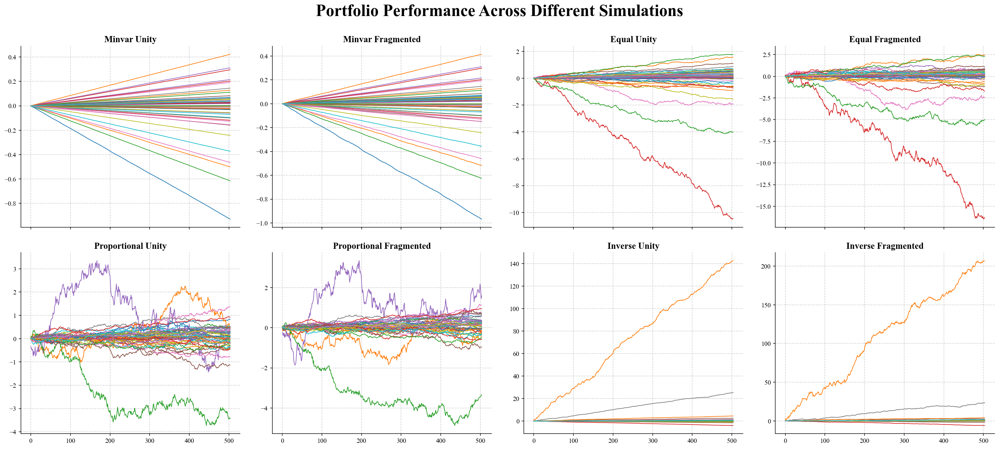

In [33]:
fig, axes = plt.subplots(2, 4, figsize=(22, 10), dpi=150, sharex=True)

for ax, (title, data) in zip(axes.flat, portfolios.items()):
    
    for sim in data[:50]:
        ax.plot(sim.cumsum(), lw=1)
    
    ax.set_title(title, weight="bold", size=14)
    ax.grid(ls="--", alpha=0.6)

fig.suptitle('Portfolio Performance Across Different Simulations', size=26, weight='bold')
plt.tight_layout(pad=2, h_pad=2, w_pad=2)
sns.despine()
plt.show()

In [34]:
corr_unity_summary = calc_metrics_multi(
    [
        minvar_corr_unity_portfolio[:, :, None],
        equal_corr_unity_portfolio[:, :, None],
        proportional_corr_unity_portfolio[:, :, None],
        inverse_corr_unity_portfolio[:, :, None],
    ],
    ['minvar', 'equal', 'proportional', 'inverse']
)

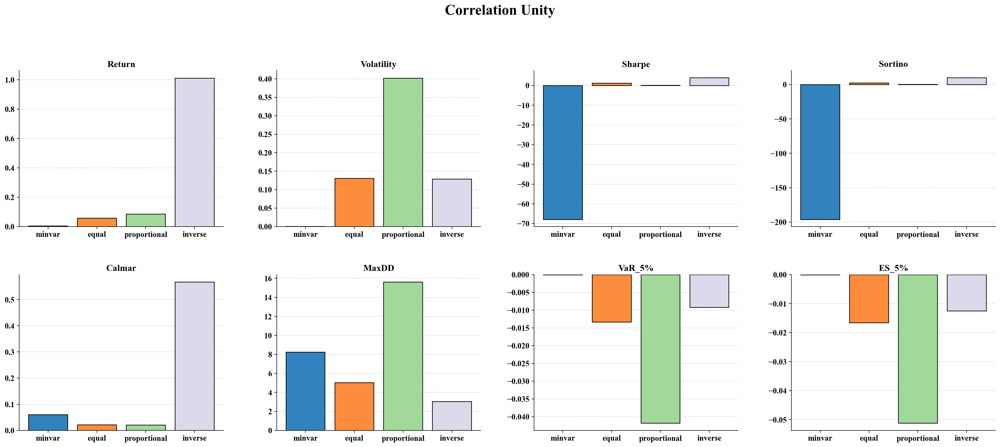

In [35]:
compare_results(corr_unity_summary, title='Correlation Unity')

In [36]:
corr_fragmented_summary = calc_metrics_multi(
                    [minvar_corr_fragmented_portfolio, equal_corr_fragmented_portfolio,
                     proportional_corr_fragmented_portfolio, inverse_corr_fragmented_portfolio],
                    ['minvar', 'equal', 'proportional', 'inverse']
                                    )

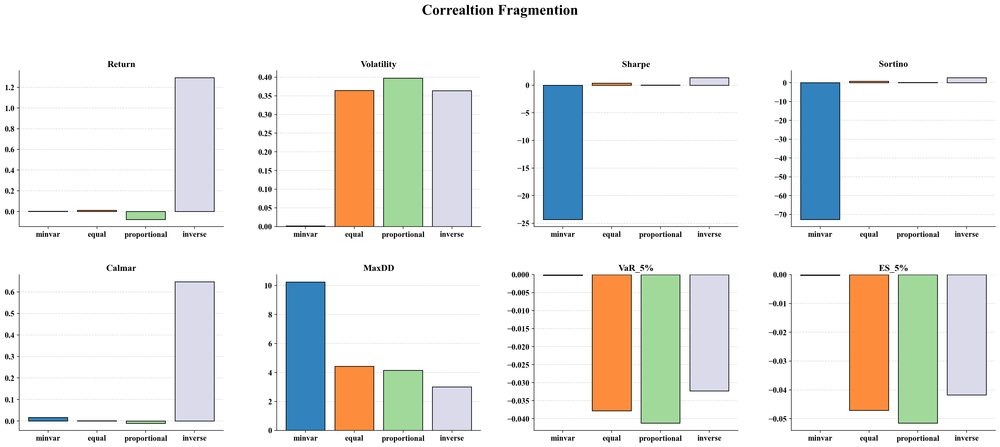

In [37]:
compare_results(corr_fragmented_summary, title='Correaltion Fragmention')

In this experiment, we kept the **mean vector** and **standard deviation vector** constant, while breaking the **correlation structure**:

- **Correlation Unity**: $C = 0.9$ (within and between groups).  
- **Correlation Fragmentation**: $C = 0.2$ (within and between groups).  

---

## Results

### A. Correlation Unity (high correlation)
- **Return:** *Inverse* is clearly the highest; *Equal* and *Proportional* small positive; *MinVar* ~0.
- **Volatility:** *MinVar* is the lowest (near-zero); *Proportional* the highest; *Equal* and *Inverse* mid-range.
- **Sharpe / Sortino:** *Inverse* leads on risk-adjusted return; *Equal* slightly positive; *Proportional* ~0; *MinVar* worst (very negative).
- **Calmar & MaxDD:** *Inverse* has the best Calmar and the lowest MaxDD; *Proportional* the largest drawdowns; *MinVar* shows a surprisingly high DD despite tiny vol.
- **VaR / ES:** **MinVar** has the tightest tails (~0); *Inverse* milder tails than *Equal/Proportional*; *Proportional* worst tails.

**Takeaway:** With correlations close to 1, diversification is weak. **Inverse** offers the best trade-off; **MinVar** is safest but return-poor; **Proportional** carries the heaviest tails.

---

### B. Correlation Fragmentation (low correlation)
- **Return:** *Inverse* has the highest average return; *Equal* small positive; *Proportional* slightly negative; *MinVar* ~0.
- **Volatility:** *MinVar* remains near-zero; *Equal/Proportional/Inverse* are similar and moderate.
- **Sharpe / Sortino:** *Inverse* is best overall; *Equal* modestly positive; *Proportional* and *MinVar* ~0/negative.
- **Calmar:** *Inverse* is clearly highest; others are near zero.
- **MaxDD:** *Inverse* lowest; *Equal/Proportional* mid; *MinVar* highest.
- **VaR / ES:** *MinVar* ~0; *Inverse* less negative than *Equal/Proportional*; *Proportional* and *Equal* have the worst tails.

**Takeaway:** When correlations fragment, **Inverse** remains the most robust performer (high return, low DD, milder tails). **Equal** is a reasonable neutral. **MinVar** stays very low-risk but under-earns; **Proportional** is weak.

---

## Overall Comparison

| Method        | Unity Case | Fragmentation Case |
|---------------|------------|---------------------|
| **MinVar**    | Stable, ultra-low vol, ~0 return; surprisingly high DD; best (tight) tails. | ~0 return; highest DD; useful only for ultra-conservative stance. |
| **Equal**     | Average performance; larger DD than Inverse; moderate tails. | Small positive return; medium risk; not best on any metric. |
| **Proportional** | Highest vol and worst tails; weak risk-adjusted results. | Slightly negative return; high risk and poor tails. |
| **Inverse**   | **Winner**: highest return, best Sharpe/Sortino, lowest DD among non-trivial weights, milder tails than Equal/Proportional. | **Winner**: highest return, lowest DD, and less severe tails than Equal/Proportional. |



## Experiment 2: Std's Only Break

In this experiment, we keep the **mean vector** and **correlation matrix** constant, while changing only the **volatility structure** (standard deviations).

---

### Setup

- **Mean vector**: fixed at $\mu = \text{baseline\_mean\_vector}$
- **Correlation matrix**: fixed at $C = \text{baseline\_corr\_matrix}$
- **Standard deviation vectors**:
  1. **Rise scenario**:
     $$
     \sigma_{\text{rise}} \sim \mathcal{N}^{+}(0.4, 0.1)
     $$
     Higher overall volatilities.
  2. **Decline scenario**:
     $$
     \sigma_{\text{decline}} \sim \mathcal{N}^{+}(0.05, 0.1)
     $$
     Lower overall volatilities.
  3. **Dispersion scenario**:
     $$
     \sigma_{\text{dispire}} \sim \mathcal{N}^{+}(0.15, 0.4)
     $$
     Large dispersion of volatilities across assets.

---

### Simulation

For each volatility scenario $\sigma \in \{\sigma_{\text{rise}}, \sigma_{\text{decline}}, \sigma_{\text{dispire}}\}$:

$$
\{ \text{logs}, \text{prices} \} = \text{run\_scenarios}\big( Z, \mu, \sigma, C \big)
$$

- $Z$: common random shocks  
- $\mu$: baseline mean vector  
- $\sigma$: chosen volatility vector  
- $C$: baseline correlation matrix  

---

### Portfolio Log-Returns

For each allocation method $m \in \{\text{minvar, equal, proportional, inverse}\}$ and volatility scenario $v \in \{\text{rise, decline, dispire}\}$:

$$
P^{m,v}_{s,t} \;=\; \sum_{i=1}^{N_{\text{ASSETS}}} \; L^{v}_{s,t,i} \cdot W^{m}_{s,i}
$$

- $s$: simulation index $(1 \dots N_{\text{SIM}})$  
- $t$: time step $(1 \dots N_{\text{STEPS}})$  
- $i$: asset index $(1 \dots N_{\text{ASSETS}})$  
- $L^{v}$: simulated log-returns under volatility scenario $v$  
- $W^{m}$: portfolio weights under method $m$  

Output shape:
$$
P^{m,v} \in \mathbb{R}^{N_{\text{SIM}} \times N_{\text{STEPS}}}
$$

---

### Output

We obtain portfolios for each combination of **method × volatility scenario**, e.g.:

- `minvar_std_rise_portfolio`
- `equal_std_decline_portfolio`
- `proportional_std_dispire_portfolio`
- `inverse_std_rise_portfolio`

---

**Goal**: Measure the sensitivity of allocation methods to volatility shifts while keeping mean and correlation constant.

In [38]:
# --- Std's raise scenario ---
std_rise_vector = abs(np.random.normal(0.4, 0.1, size=N_ASSETS))

# ---Std's decline scenario ---
std_decline_vector = abs(np.random.normal(0.05, 0.1, size=N_ASSETS))

# ---std's dispire scenario ---
std_dispire_vector = abs(np.random.normal(0.15, 0.4, size=N_ASSETS))

In [39]:
# --- std's rise ---
std_rise_logs, std_rise_prices = run_scenarios(
    Z, baseline_mean_vector, std_rise_vector, baseline_corr_matrix
)

# --- std's decline ---
std_decline_logs, std_decline_prices = run_scenarios(
    Z, baseline_mean_vector, std_decline_vector, baseline_corr_matrix
)

# --- std's dispire ---
std_dispire_logs, std_dispire_prices = run_scenarios(
    Z, baseline_mean_vector, std_dispire_vector, baseline_corr_matrix
)

In [40]:
minvar_std_raise_portfolio = (std_rise_logs * minvar_weights).sum(axis=2)
minvar_std_decline_portfolio = (std_decline_logs * minvar_weights).sum(axis=2)
minvar_std_dispire_portfolio = (std_dispire_logs * minvar_weights).sum(axis=2)

equal_std_raise_portfolio = (std_rise_logs * equal_weights).sum(axis=2)
equal_std_decline_portfolio = (std_decline_logs * equal_weights).sum(axis=2)
equal_std_dispire_portfolio = (std_dispire_logs * equal_weights).sum(axis=2)

proportional_std_raise_portfolio = (std_rise_logs * proportional_weights).sum(axis=2)
proportional_std_decline_portfolio = (std_decline_logs * proportional_weights).sum(axis=2)
proportional_std_dispire_portfolio = (std_dispire_logs * proportional_weights).sum(axis=2)

inverse_std_raise_portfolio = (std_rise_logs * inverse_weights).sum(axis=2)
inverse_std_decline_portfolio = (std_decline_logs * inverse_weights).sum(axis=2)
inverse_std_dispire_portfolio = (std_dispire_logs * inverse_weights).sum(axis=2)

In [41]:
std_portfolios = {
        "Minvar Rise": minvar_std_raise_portfolio,
        "Minvar Decline": minvar_std_decline_portfolio,
        "Minvar Dispire": minvar_std_dispire_portfolio,
    
        "Equal Rise": equal_std_raise_portfolio,
        "Equal Decline": equal_std_decline_portfolio,
        "Equal Dispire": equal_std_dispire_portfolio,
    
        "Proportional Rise":proportional_std_raise_portfolio,
        "Proportional Decline": proportional_std_decline_portfolio,
        "Proportional Dispire": proportional_std_dispire_portfolio,
    
        "Inverse Rise": inverse_std_raise_portfolio,
        "Inverse Decline": inverse_std_decline_portfolio,
        "Inverse Dispire": inverse_std_dispire_portfolio,
}

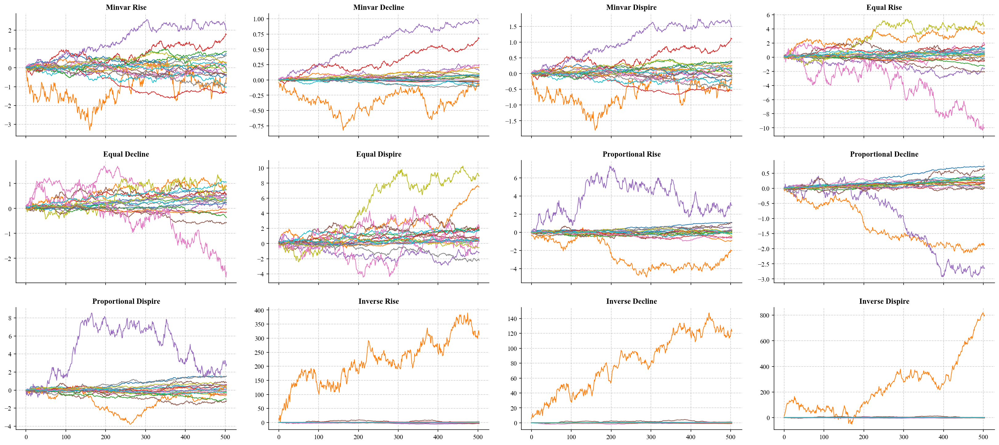

In [42]:
fig, axes = plt.subplots(3, 4, figsize=(22, 10), dpi=150, sharex=True)

for ax, (title, data) in zip(axes.flat, std_portfolios.items()):
    
    for sim in data[:20]:
        ax.plot(sim.cumsum(), lw=1)
    
    ax.set_title(title, weight="bold")
    ax.grid(ls="--", alpha=0.6)


plt.tight_layout(pad=2, h_pad=2, w_pad=2)
sns.despine()
plt.show()

In [43]:
std_raise_summary = calc_metrics_multi(
                    [minvar_std_raise_portfolio, equal_std_raise_portfolio,
                     proportional_std_raise_portfolio, inverse_std_raise_portfolio],
                    ['minvar', 'equal', 'proportional', 'inverse']
                                    )

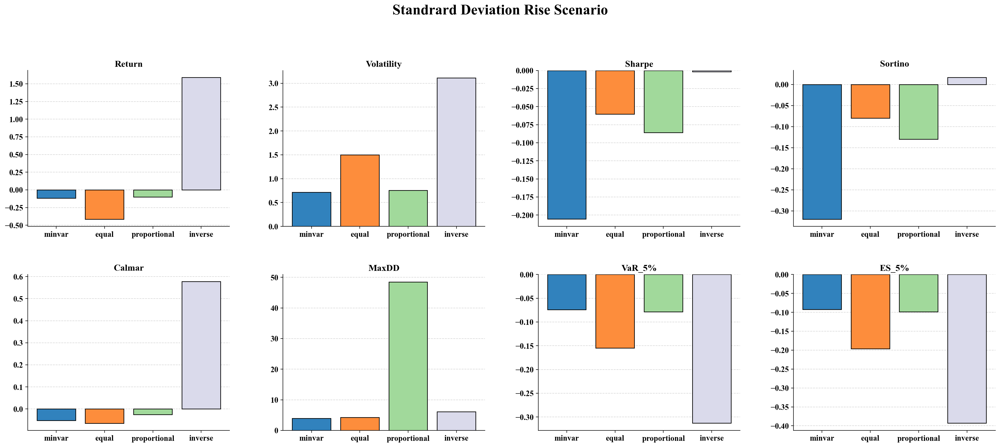

In [44]:
compare_results(std_raise_summary, title='Standrard Deviation Rise Scenario')

In [45]:
std_decline_summary = calc_metrics_multi(
                    [minvar_std_decline_portfolio, equal_std_decline_portfolio,
                     proportional_std_decline_portfolio, inverse_std_decline_portfolio],
                    ['minvar', 'equal', 'proportional', 'inverse']
                                    )

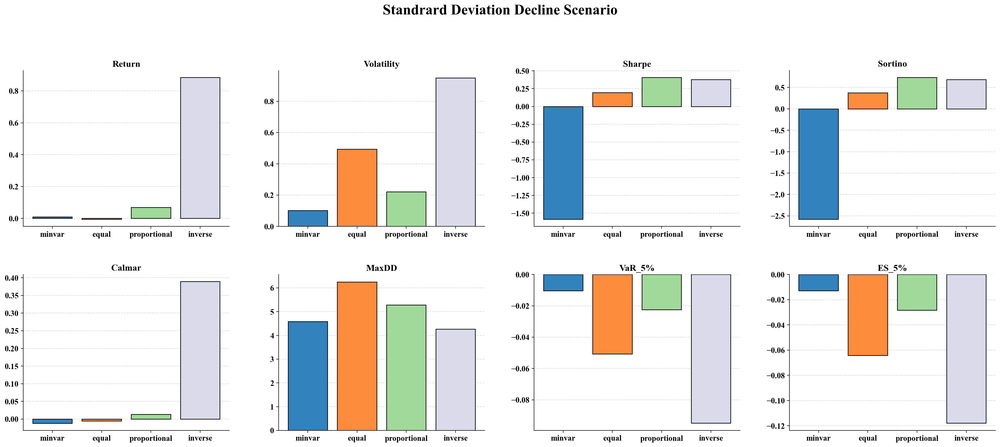

In [46]:
compare_results(std_decline_summary, title='Standrard Deviation Decline Scenario')

In [47]:
std_dispire_summary = calc_metrics_multi(
                    [minvar_std_dispire_portfolio, equal_std_dispire_portfolio,
                     proportional_std_dispire_portfolio, inverse_std_dispire_portfolio],
                    ['minvar', 'equal', 'proportional', 'inverse']
                                    )

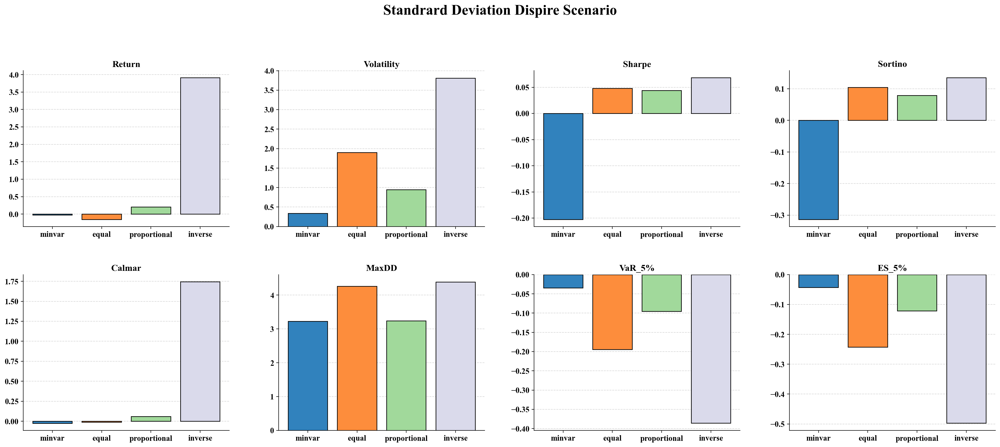

In [48]:
compare_results(std_dispire_summary, title='Standrard Deviation Dispire Scenario')


In this experiment, we fixed the **mean vector** and **correlation structure**, while perturbing the **volatility vector**.  
Three cases were tested:

1. **Volatility Rise:** $\sigma \uparrow$
2. **Volatility Decline:** $\sigma \downarrow$
3. **Volatility Dispersion:** $\sigma$ values spread apart

---

## Results

### A. Volatility Rise (σ up strongly)
- **Return:** *Inverse* dominates (≈1.6); *Equal* clearly negative; *Proportional* mildly negative; *MinVar* slightly negative.
- **Volatility:** *Inverse* highest (~3.1); *Equal/Proportional* mid; *MinVar* lowest.
- **Sharpe / Sortino:** *Inverse* ~0 (best); *Equal* and *Proportional* negative; *MinVar* worst (strongly negative).
- **Calmar & MaxDD:** *Inverse* best Calmar with low DD (≈5); *Proportional* worst DD (≈49); *MinVar/Equal* small/medium DD.
- **VaR / ES:** *MinVar* and *Proportional* have the tightest tails (≈−0.08 to −0.11); *Equal* worse; *Inverse* shows very poor **VaR** (~−0.30) but **ES** close to 0.

**Takeaway:** When σ jumps, **Inverse-vol** captures the upside and keeps DD contained, but its single-period **VaR** is harsh. **MinVar** remains safest on tails but under-earns; **Equal/Proportional** deteriorate.

---

### B. Volatility Decline (σ down strongly)
- **Return:** *Inverse* highest (~0.9); *Proportional* small positive; *MinVar* ~0; *Equal* slightly negative.
- **Volatility:** *Inverse* highest; *Equal/Proportional* mid; *MinVar* lowest.
- **Sharpe / Sortino:** *Proportional* best; *Inverse* close second; *Equal* modest; *MinVar* strongly negative.
- **Calmar & MaxDD:** *Inverse* best Calmar and the **lowest** DD (~4.3); others higher (Equal highest).
- **VaR / ES:** *Inverse* worst tails (most negative VaR/ES); *MinVar* tightest; *Proportional* moderate; *Equal* middling.

**Takeaway:** With falling σ, **Proportional** leads on risk-adjusted return, **Inverse** leads on return and DD, but **Inverse** still carries the heaviest tail risk. **MinVar** remains tail-safe but return-poor.

---

### C. Volatility Dispersion (mean σ unchanged, spread higher)
- **Return:** *Inverse* very high (~3.9); *Proportional* small positive; *Equal* slightly negative; *MinVar* ~0.
- **Volatility:** *Inverse* highest (~3.8); *Equal* high; *Proportional* moderate; *MinVar* lowest.
- **Sharpe / Sortino:** *Inverse* best; *Equal/Proportional* small positive; *MinVar* negative.
- **Calmar:** *Inverse* far ahead; others near zero.
- **MaxDD:** *Inverse* highest among the four (~4.4) but not catastrophic; *Equal/Proportional* mid; *MinVar* lower.
- **VaR / ES:** *Inverse* worst tails by far (VaR/ES most negative); *Equal* next; *Proportional* moderate; *MinVar* tight.

**Takeaway:** Greater σ dispersion strongly favors **Inverse-vol** on returns and ratios, but it pays with **much heavier tails**. **Proportional** offers a tempered middle ground; **MinVar** is the tail-shield baseline with minimal performance.

---

## Overall Comparison

| Method           | Volatility **Rise** (σ ↑ strongly)                                                                 | Volatility **Decline** (σ ↓ strongly)                                                                 | **Dispersion ↑** (mean σ unchanged, spread higher)                                                            |
|------------------|-----------------------------------------------------------------------------------------------------|--------------------------------------------------------------------------------------------------------|----------------------------------------------------------------------------------------------------------------|
| **MinVar**       | Safest on tails (tight VaR/ES) and lowest vol, but slightly negative return; Sharpe strongly negative. | Tail-safe baseline with ~0 return; Sharpe very negative; DD higher than Inverse.                        | Lowest vol and tightest tails; ~0 return; weak risk-adjusted metrics.                                          |
| **Equal**        | Clearly negative return; mid vol and mid DD; tails worse than MinVar/Proportional.                  | Slightly negative return; mid vol; **highest DD**; middling tails.                                     | Slightly negative return; high vol; mid DD; second-worst tails.                                               |
| **Proportional** | Mildly negative return; mid vol; **worst DD (~49)**; tails surprisingly tight (VaR/ES among best).  | Small positive return; **best Sharpe/Sortino**; mid vol and tails; DD above Inverse.                   | Small positive return; moderate vol; moderate DD; moderate tails (middle-ground profile).                      |
| **Inverse**      | **Winner on return** (≈1.6) with **low DD (~5)**; vol highest; **harsh single-period VaR (~−0.30)** though ES ~0. | **Leader on return & DD** (highest return, **lowest DD**); close second Sharpe; **worst tails** (VaR/ES). | **Winner on return** (very high); highest vol; best Sharpe/Sortino; **worst tails** and highest DD (but not extreme). |



# Summary and Limitations

This study explored how different portfolio allocation methods behave under synthetic scenarios generated via Monte Carlo simulations.  
We compared methods (**MinVar**, **Equal**, **Proportional**, **Inverse**) across correlation breaks and volatility shocks, focusing on risk–return trade-offs and robustness to structural changes.

---

## Methodological Limitations

1. **Single Random Seed**  
   Although a large number of simulations were run, they were all generated under a fixed random seed ($99$).  
   This ensures reproducibility but may bias results to a specific realization of randomness.  
   Averaging across multiple independent seeds would improve reliability.

2. **Uniform Intra-Cluster Correlations**  
   Correlations within each group were assumed to be perfectly homogeneous.  
   This simplification was chosen to guarantee a **positive semi-definite** correlation matrix, ensuring stable **Cholesky decomposition** and avoiding numerical issues.  
   However, real markets exhibit heterogeneous correlations even within clusters.

3. **No Negative Correlations**  
   The correlation matrices were restricted to non-negative values.  
   This design choice again ensured mathematical stability, but it also limited realism: in practice, assets (e.g., equities vs. bonds, or hedging instruments) often exhibit negative correlations.  
   Excluding these cases reduces the external validity of the results.

---

## Additional Considerations

- **Stylized Distributions:** Asset returns were modeled via **Geometric Brownian Motion** with normally distributed shocks.  
  This framework ignores empirical features such as fat tails, skewness, or volatility clustering that are prominent in financial data.

- **Stationarity Assumption:** The experiments implicitly assumed stable statistical properties (means, volatilities, correlations) throughout the horizon.  
  In reality, markets are non-stationary, and regime changes occur abruptly.

- **Evaluation Metrics:** The analysis focused on classical performance indicators (Sharpe, Sortino, Calmar, MaxDD, VaR, ES).  
  These are informative but have known limitations - for instance, VaR underestimates tail risks in non-normal settings.

- **Synthetic vs. Real Data:** The results highlight *structural sensitivities* under controlled, artificial scenarios.  
  They should not be interpreted as direct forecasts for real-world portfolios but as a methodological exploration.

---

## Key Takeaway

Despite these constraints, the experiments demonstrate how **allocation rules interact with correlation and volatility structures**:  
- **Equal weighting** tends to perform robustly in fragmented markets.  
- **Proportional weighting** thrives when volatilities decline.  
- **MinVar** is effective under high dispersion of risks.  
- **Inverse weighting** shows occasional upside but generally carries unsustainable tail risks.

Overall, the framework provides a useful laboratory for testing allocation resilience under stylized market conditions, while highlighting the need for further work incorporating richer data-generating processes and more flexible correlation structures.


# Suggestions for Future Work

This project examined two controlled scenarios under the methodological limitations previously outlined:  

1. **Correlation Breaks** - altering the correlation matrix while holding means and volatilities fixed.  
2. **Volatility Shocks** - altering the standard deviation vector while keeping correlations and means constant.  

---

## Extensions Beyond Current Limitations

- **Multiple Random Seeds**  
  Running the simulations across several independent random seeds would provide more robust average outcomes and reduce the influence of idiosyncratic random draws.

- **Heterogeneous and Negative Correlations**  
  Introducing realistic variations in within-cluster correlations and allowing for negative correlations would increase fidelity to actual market dynamics.  
  This requires additional techniques to maintain positive semi-definiteness of the covariance matrix.

- **Non-Gaussian Return Processes**  
  Extending beyond the Geometric Brownian Motion assumption to models with heavy tails, skewness, or stochastic volatility (e.g., GARCH, Heston, or jump-diffusion models) could yield insights more aligned with empirical asset returns.

---

## Cross-Scenario Experiments

In addition to isolated experiments, it would be valuable to study **joint perturbations** where multiple parameters shift simultaneously:

- **Correlation + Volatility Breaks**  
  Explore how allocation methods behave when both correlation structures fragment and volatilities rise or fall.  
  This mirrors crisis environments, where diversification benefits collapse while volatility spikes.

- **Mean Shifts + Risk Shocks**  
  Simultaneous changes in expected returns and risk structures (volatility or correlation).  
  Such scenarios can test whether allocation methods remain stable when expected premia move against risk dynamics.

- **Sequential Regime Changes**  
  Introducing time-varying parameters (e.g., correlations drifting upward, volatilities clustering) would approximate regime-switching behavior seen in real financial markets.

---

## Overall Proposal

The framework established here provides a foundation for controlled, synthetic experiments.  
The natural next step is to **combine multiple sources of structural breaks** - correlations, volatilities, and means - to approximate crisis-like conditions.  
This would test the resilience of allocation methods in environments closer to real-world market regimes.